In [2]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Circle
import skimage as ski
from PIL import Image
from amsurf.BRDF import BRDF_dig, BRDF_dig_sum
import pandas as pd


Image.MAX_IMAGE_PIXELS = None

# UK ATC Meeting 1: Analysis Workflow

**Date:** 06/05/2025

**Description:** This notebook outlines the workflow for analysis of the BRDF
caused by pores in the surface of AM samples. The analysis can be broken down
into the following steps:

1. **Data Preparation**: Load the data and prepare it for analysis (e.g. cropping,
   filtering, etc.).

2. **Pore Segmentation**: Use a segmentation algorithm to identify the pores in the
   images.

3. **Pore Analysis**: Analyze the segmented pores to extract relevant features
   (e.g. size, shape, etc.).

4. **BRDF Calculation**: Calculate the BRDF from the pore data.

## Step 1: Data Preparation


Original image size: (18978, 18495)
Downsampled image size: (1897, 1849)
Crop limits: [400, 400, 800, 800]


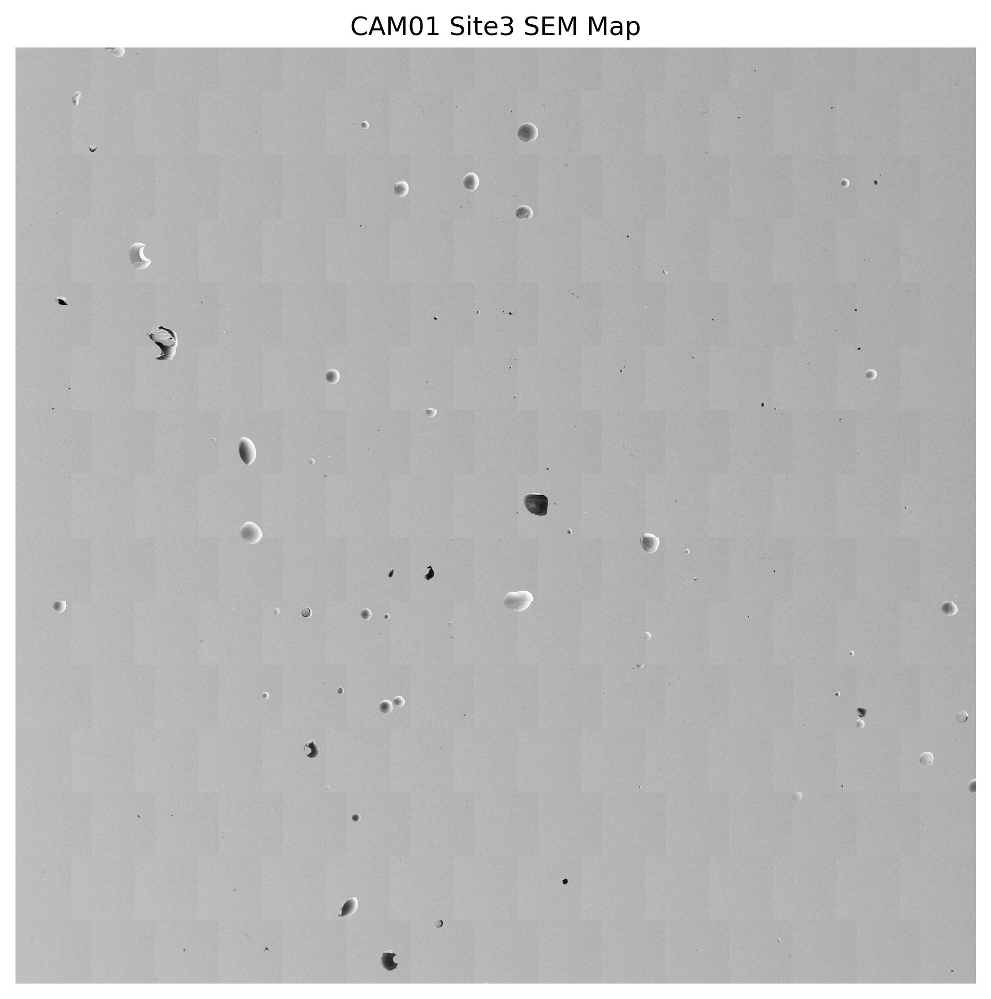

In [ ]:
# load an image
full_img = Image.open("../data/project_sharepoint/02_Sample01__GL_concave/01_SEM_maps/20241210_CAM01_Site3_SESI_Map.tif")
img_size = full_img.size

# downsample
downsample_factor = 10
lr_full_img = full_img.resize((img_size[0] // downsample_factor,
                               img_size[1] // downsample_factor))

print(f"Original image size: {img_size}")
print(f"Downsampled image size: {lr_full_img.size}")


# crop limits for analysis
crop_lims = [4000, 4000, 8000, 8000]
# adjust the limits to the downsampled image
lr_crop_lims = [crop_lims[0] // downsample_factor,
                  crop_lims[1] // downsample_factor,
                  crop_lims[2] // downsample_factor,
                  crop_lims[3] // downsample_factor]
# crop the image
print(f"Crop limits: {lr_crop_lims}")
crop_rect = Rectangle((lr_crop_lims[0], lr_crop_lims[1]),
                      lr_crop_lims[2] - lr_crop_lims[0],
                      lr_crop_lims[3] - lr_crop_lims[1],
                      linewidth=1,
                      edgecolor='r',
                      facecolor='none')

# plot the image
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
ax.imshow(lr_full_img, cmap="gray", origin="lower")
ax.set_title("CAM01 Site3 SEM Map")
ax.axis("off")
# ax.add_patch(crop_rect)
plt.savefig("../reports/project_meetings/ATC-meeting_080525/CAM01_Site3_SEM_Map.png", bbox_inches='tight', dpi=300)
plt.show()

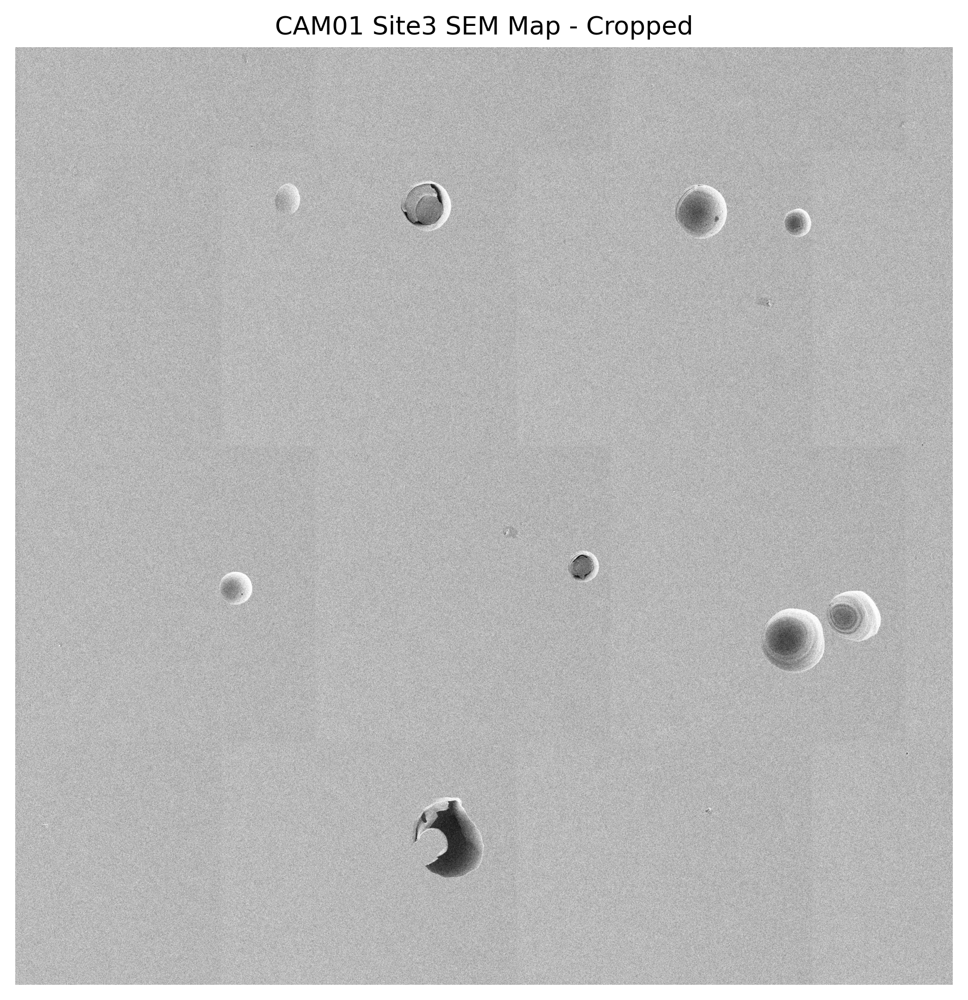

In [4]:
# crop the image
crop_img = full_img.crop((crop_lims[0], crop_lims[1], crop_lims[2], crop_lims[3]))

# plot the cropped image
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
ax.imshow(crop_img, cmap="gray", origin="lower")
ax.set_title("CAM01 Site3 SEM Map - Cropped")
ax.axis("off")
plt.savefig("../reports/project_meetings/ATC-meeting_080525/CAM01_Site3_SEM_Map_cropped.png", bbox_inches='tight', dpi=300)
plt.show()

## Step 2: Pore Segmentation

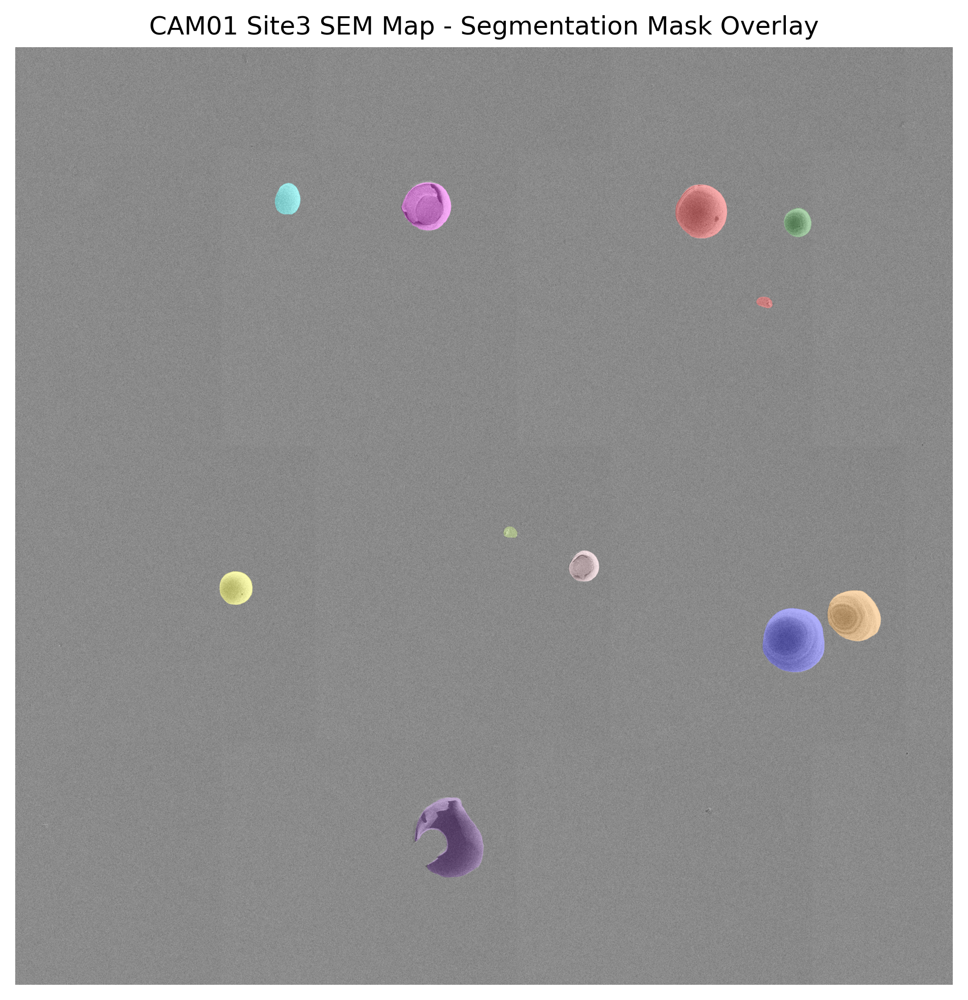

In [5]:
# Lload the segmentation mask
segmentation_mask = np.loadtxt("../data/project_sharepoint/05_processed/sam-output_test_crb_020525.txt")
crop_img_arr = np.array(crop_img)

label_overlay = ski.color.label2rgb(segmentation_mask, bg_label=0, alpha=0.3, 
                                    image=crop_img_arr, kind='overlay')
# show the segmentation mask as an overlay
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
ax.imshow(label_overlay, origin='lower')
ax.axis("off")
ax.set_title("CAM01 Site3 SEM Map - Segmentation Mask Overlay")
plt.savefig("../reports/project_meetings/ATC-meeting_080525/CAM01_Site3_SEM_Map_segmentation_overlay.png", bbox_inches='tight', dpi=300)
plt.show()



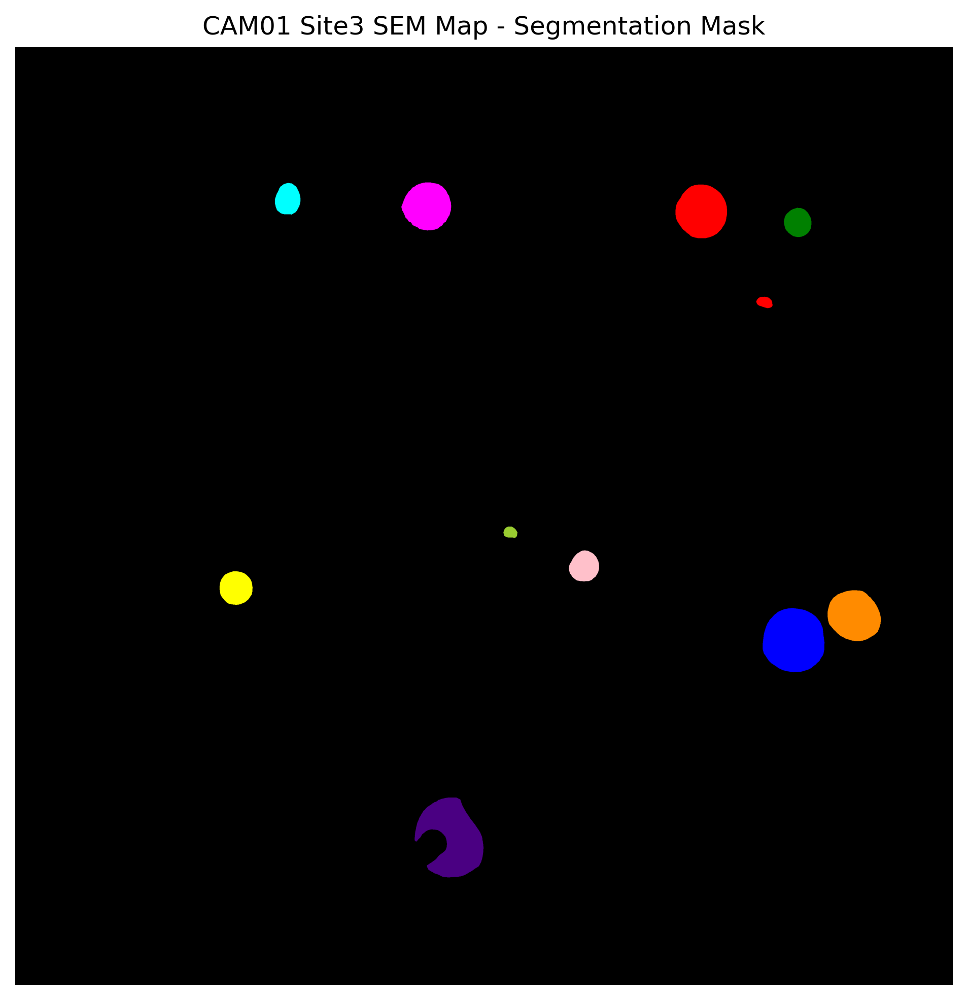

In [6]:
segmentation_mask = np.loadtxt("../data/project_sharepoint/05_processed/sam-output_test_crb_020525.txt")
crop_img_arr = np.array(crop_img)

label = ski.color.label2rgb(segmentation_mask, bg_label=0)
# show the segmentation mask as an overlay
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
ax.imshow(label, origin='lower')
ax.axis("off")
ax.set_title("CAM01 Site3 SEM Map - Segmentation Mask")
plt.savefig("../reports/project_meetings/ATC-meeting_080525/CAM01_Site3_SEM_Map_segmentation.png", bbox_inches='tight', dpi=300)
plt.show()


## Step 3: Pore Analysis

In [7]:
# create a region prop table
pixel_size = 200e-9

prop_tab = ski.measure.regionprops_table(segmentation_mask.astype(int).T,
                                         spacing=pixel_size,
                                         properties=('label', 'area', 'centroid',
                                                     'equivalent_diameter_area'))

# convert to a pandas dataframe
prop_df = pd.DataFrame(prop_tab)
prop_df

,label,area,centroid-0,centroid-1,equivalent_diameter_area
0,1,1.577720e-09,0.000586,0.000660,0.000045
1,2,2.313440e-09,0.000664,0.000294,0.000054
2,3,6.434800e-10,0.000188,0.000338,0.000029
3,4,1.322840e-09,0.000351,0.000664,0.000041
4,5,4.559200e-10,0.000668,0.000650,0.000024
5,6,2.453440e-09,0.000373,0.000125,0.000056
6,7,1.537000e-09,0.000716,0.000315,0.000044
7,8,4.616000e-10,0.000232,0.000670,0.000024
8,9,5.241600e-10,0.000486,0.000357,0.000026
9,10,9.144000e-11,0.000422,0.000386,0.000011


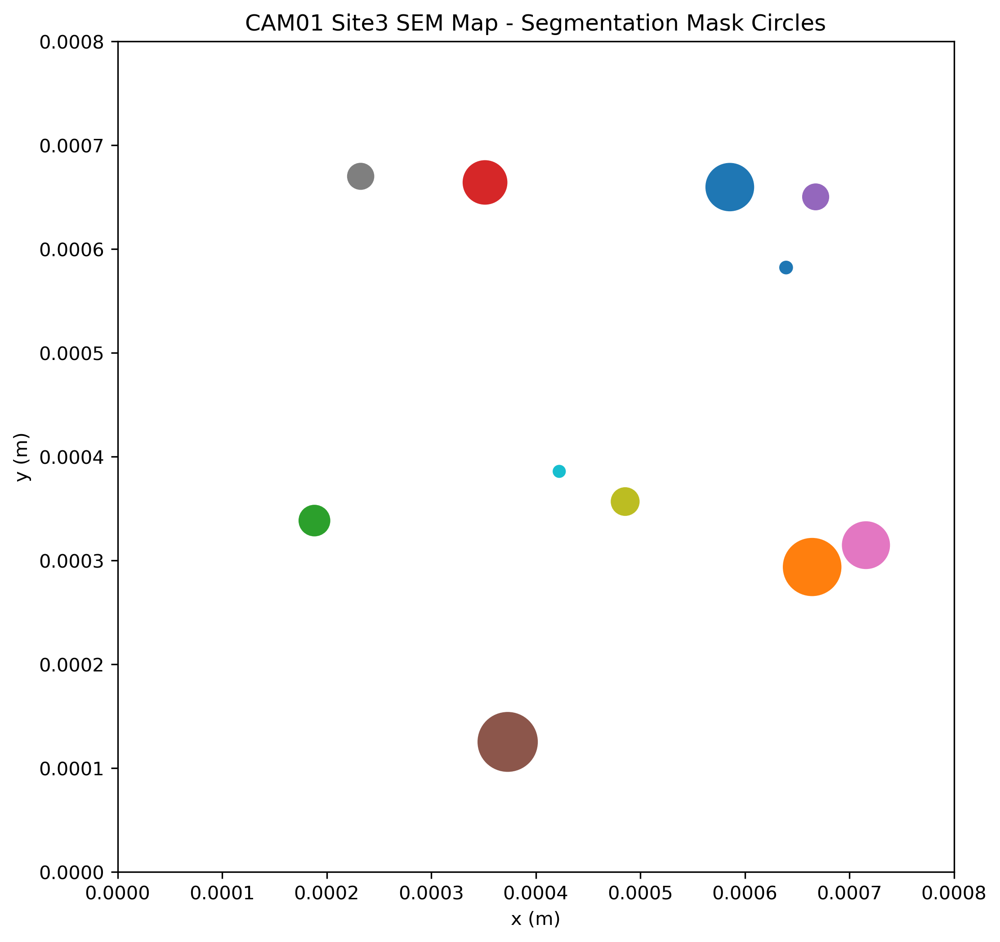

In [8]:
# plot the circles
fig, ax = plt.subplots(figsize=(8, 8), dpi=300)
for i in range(len(prop_df)):
    # get the centroid
    centroid = prop_df.iloc[i]['centroid-0'], prop_df.iloc[i]['centroid-1']
    # get the equivalent diameter
    diameter = prop_df.iloc[i]['equivalent_diameter_area']
    # create a circle
    circle = Circle(centroid, diameter / 2, fill=True, color="C"+str(i))
    # add the circle to the plot
    ax.add_patch(circle)
ax.set_xlim(0, 8e-4)
ax.set_ylim(0, 8e-4)
ax.set_xlabel("x (m)")
ax.set_ylabel("y (m)")
ax.set_title("CAM01 Site3 SEM Map - Segmentation Mask Circles")
plt.savefig("../reports/project_meetings/ATC-meeting_080525/CAM01_Site3_SEM_Map_segmentation_circles.png", bbox_inches='tight', dpi=300)
plt.show()

## Step 4: BRDF Calculation

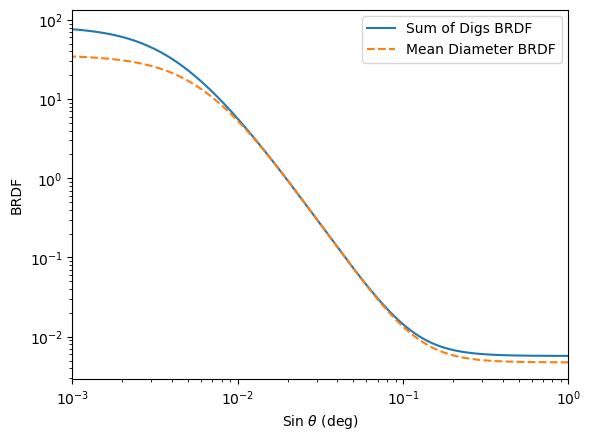

In [10]:
crop_len = np.shape(crop_img_arr)[0] * pixel_size
crop_wid = np.shape(crop_img_arr)[1] * pixel_size

total_area = crop_len * crop_wid


wl = 0.6e-6
theta = np.linspace(0, np.pi / 2, 10000)

sample_darr = prop_df['equivalent_diameter_area'].to_numpy()

sample_BRDF = BRDF_dig_sum(sample_darr, total_area, wl, theta)

Nd = len(sample_darr)/total_area
mean_sample_BRDF = BRDF_dig(Nd, np.mean(sample_darr), wl, theta)

fig, ax = plt.subplots()
ax.plot(np.sin(theta), sample_BRDF, label='Sum of Digs BRDF')
ax.plot(np.sin(theta), mean_sample_BRDF, label='Mean Diameter BRDF', linestyle='--')
ax.set_xlabel(r"Sin ${\theta}$ (deg)")
ax.set_ylabel("BRDF")
ax.set_xscale("log")
ax.set_yscale("log")
ax.set_xlim(0.001, 1)
ax.legend()
fig.savefig("../reports/project_meetings/ATC-meeting_080525/CAM01_Site3_BRDF.png", bbox_inches='tight', dpi=300)
plt.show()